In [1]:
%matplotlib notebook

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

from matplotlib import pyplot as plt
from matplotlib import cm,colors
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
import scipy as sp
from scipy.spatial import cKDTree
import pickle
from donutlib.decamutil import decaminfo
from scriptUtil import decodeNumberList

from pixmappy import DESMaps, Gnomonic
from meshutil import mkDonutAnaDF

PointMesh: Could not load ROOT
donutana: could not import ROOT


In [2]:
%env CAL_PATH=/u/ec/roodman/kipacdisk/Pixmappy/Y6A1_ASTROMETRY

env: CAL_PATH=/u/ec/roodman/kipacdisk/Pixmappy/Y6A1_ASTROMETRY


In [3]:
import pickle
from scipy.interpolate import Rbf


class wavefrontmap(object):
    """ wavefrontmap is a class used to build and access a Wavefront map - zernike coefficients vs. X,Y

    Aaron Roodman (C) SLAC National Accelerator Laboratory, Stanford University 2018.
    """

    def __init__(self,file=""):
        # init contains all initializations which are done only once for all fits
        
        self.file = file
        mapdict = pickle.load(open(self.file,'rb'))
        self.x = mapdict['x']
        self.y = mapdict['y']
        self.zcoeff = mapdict['zcoeff']

        self.interpDict = {}
        for iZ in range(3,37):    # numbering is such that iZ=3 is zern4
            self.interpDict[iZ] = Rbf(self.x, self.y, self.zcoeff[:,iZ])        

    def get(self,x,y,nZernikeFirst=5,nZernikeLast=37):
        # fill an array with Zernike coefficients for this x,y in the Map

        zout = np.zeros((nZernikeLast-nZernikeFirst+1))
        for iZactual in range(nZernikeFirst,nZernikeLast+1):
            iZ = iZactual-1
            zout[iZactual-nZernikeFirst] = self.interpDict[iZ](x,y)

        return zout
    
    def getArray(self,x,y,iZactual):
        iZ = iZactual - 1
        zout = self.interpDict[iZ](x,y)
        return zout
        


In [4]:
def plotMPL2D(X,Y,Z,zmin=-50.,zmax=50.,title="",cmap=cm.jet):
    """ plot the Mesh
    """

    fig = plt.figure(figsize=(10,7.5))
    ax = fig.gca()

    # hard code X,Y limits to be DECam boundaries
    minX = -235.
    maxX = 235.
    minY = -235.
    maxY = 235.

    anorm = colors.Normalize(zmin,zmax,True)

    # loop over Extensions
    for iCoord in X.keys():
        cset = ax.pcolor(X[iCoord], Y[iCoord], Z[iCoord], cmap=cmap, norm=anorm)

    ax.set_xlabel('X',fontsize=24)
    ax.set_xlim(minX, maxX)
    ax.set_ylabel('Y',fontsize=24)
    ax.set_ylim(minY, maxY)
    if title=="":
        ax.set_title(title,fontsize=24)

    # add the colorbar
    fig.colorbar(cset)

    return fig,ax,cset

In [5]:
def plotMeshesDFtemp(dfDirectory,dfName,zVarPattern="z%dcorr",usedFlag=True,subtFunc=None,
                     minDict={4:-20.,5:-0.2,6:-0.2,7:-0.125,8:-0.125,9:-0.3,10:-0.3,11:-0.15,14:-0.1,15:-0.1},
                     maxDict={4:20.,5:0.2,6:0.2,7:0.125,8:0.125,9:0.3,10:0.3,11:0.15,14:0.1,15:0.1}):
    iZs = [4]
    if usedFlag:
        da = mkDonutAnaDF(dfDirectory+"/"+dfName+".pkl",iZs,zVarPattern=zVarPattern,sensorSet="ScienceOnly",method="idw",methodVal=(250,1.0),nInterpGrid=32,donutCutString="flagFinal==True")
    else:
        da = mkDonutAnaDF(dfDirectory+"/"+dfName+".pkl",iZs,zVarPattern=zVarPattern,sensorSet="ScienceOnly",method="idw",methodVal=(250,1.0),nInterpGrid=32)
        
    for iZ in iZs:
        print(iZ)
        meshN = "z%dMesh" % (iZ)
        if meshN in da.meshDict:
            aMesh = da.meshDict[meshN]
            f,a,c = aMesh.plotMeshMPL2D(zmin=minDict[iZ],zmax=maxDict[iZ],cmap=cm.jet,interactiveFlag=True,subtFunc=subtFunc)
            #f.savefig(dfName+"_z%d.png" % (iZ))


In [6]:
def zemaxZernike4(X,Y):
    Z = zemaxWFmap.getArray(X,Y,4)
    # convert to defocus
    Z = Z * 1.189 * (1500./8.7)
    return Z

In [7]:
zemaxWFmap = wavefrontmap("/u/ec/roodman/Astrophysics/Donuts/decam_2012-nominalzernike.pickle")

[0.11058071 0.10417957 0.09906236 ... 0.09906236 0.10417957 0.11058071]


<IPython.core.display.Javascript object>


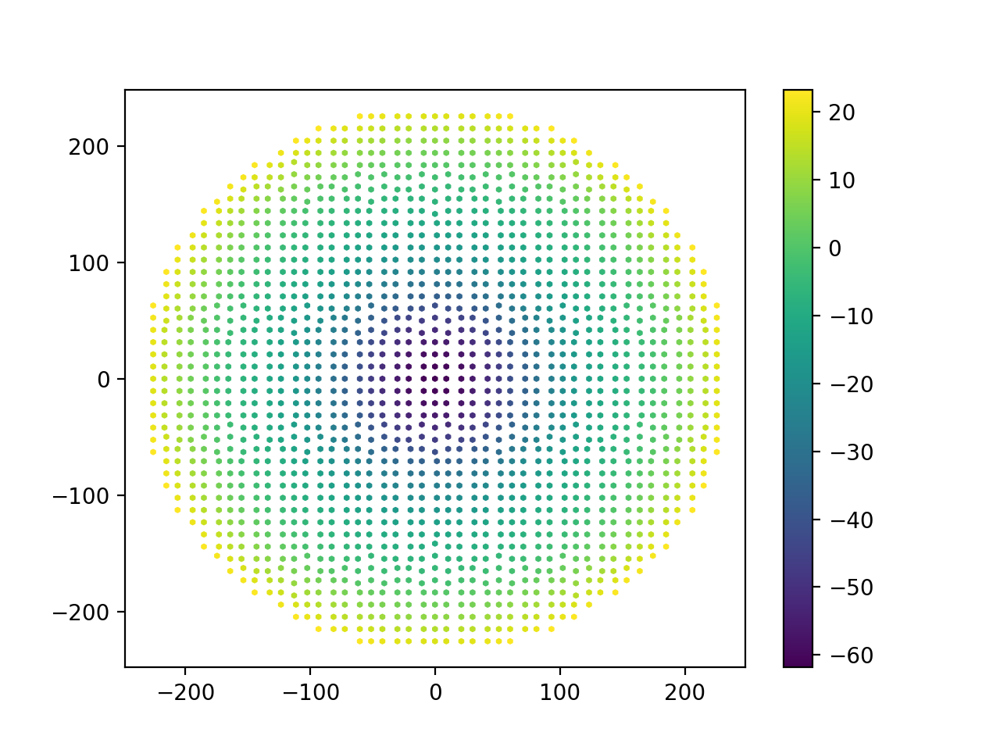

In [8]:
zDict = pickle.load(open("decam_2012-nominalzernike.pickle",'rb'))
print(zDict['zcoeff'][:,3])
f = plt.figure()
h = plt.hexbin(zDict['x'],zDict['y'],zDict['zcoeff'][:,3]* 1.189 * (1500./8.7),gridsize=150)
plt.colorbar()

In [9]:
#plotMeshesDFtemp("ComboMeshesZemaxIteration2v22","ComboMesh_Science-20140212s2-v22i2_All",subtFunc=zemaxZernike4)

4


<IPython.core.display.Javascript object>


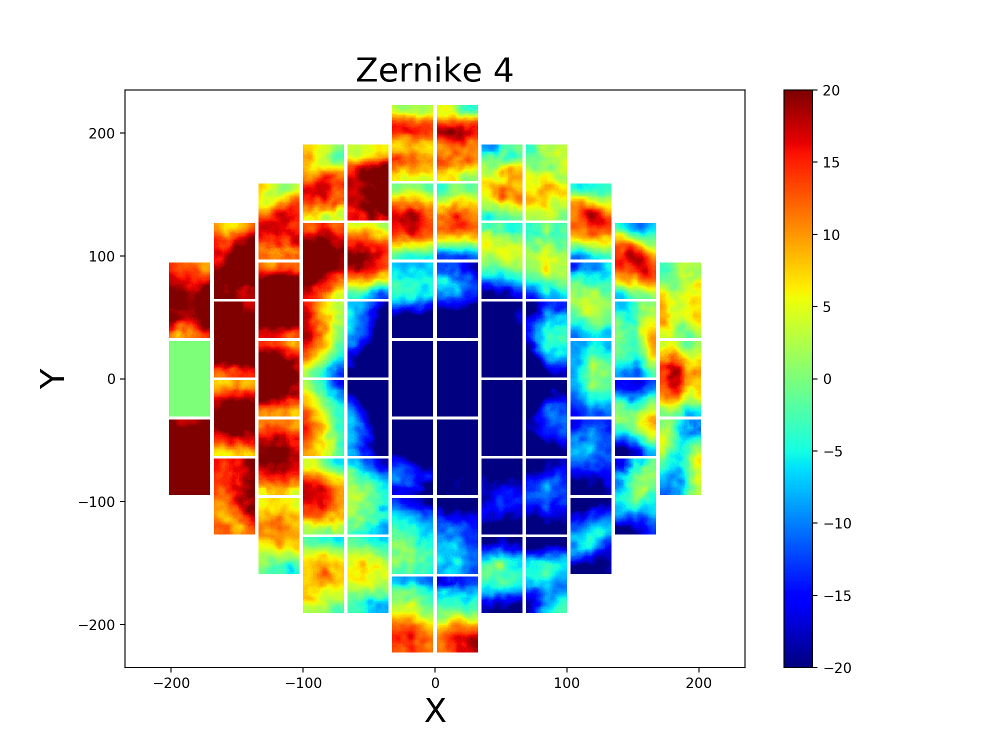

In [10]:
plotMeshesDFtemp("ComboMeshesZemaxIteration2v22","ComboMesh_Science-20140212s2-v22i2_All")

In [11]:
dfDirectory = "ComboMeshesZemaxIteration2v22"
dfName = "ComboMesh_Science-20140212s2-v22i2_All"
zVarPattern="z%dcorr"
usedFlag=True
minDict={4:-20.,5:-0.2,6:-0.2,7:-0.125,8:-0.125,9:-0.3,10:-0.3,11:-0.15,14:-0.1,15:-0.1}
maxDict={4:20.,5:0.2,6:0.2,7:0.125,8:0.125,9:0.3,10:0.3,11:0.15,14:0.1,15:0.1}

iZs = [4]
da = mkDonutAnaDF(dfDirectory+"/"+dfName+".pkl",iZs,zVarPattern=zVarPattern,sensorSet="ScienceOnly",method="idw",methodVal=(250,1.0),nInterpGrid=32,donutCutString="flagFinal==True")
        
for iZ in iZs:
    print(iZ)
    meshN = "z%dMesh" % (iZ)
    if meshN in da.meshDict:
        aMesh = da.meshDict[meshN]
        X_all,Y_all,Xcen_all,Ycen_all,Z_all,ZVig_all = aMesh.calcMeshMPL2D()





4


In [12]:
Zemax_all = {}
for akey in X_all:
    Zemax_all[akey] = zemaxZernike4(Xcen_all[akey].flatten(),Ycen_all[akey].flatten()).reshape(Xcen_all[akey].shape)
    

In [13]:
# subtract values in Z_all and Zemax_all
# also find mean offset
zDiff = {}
n = 0
sdiff = 0.
for iCoord in Z_all.keys():
    zDiff[iCoord] = Z_all[iCoord] - Zemax_all[iCoord]
    n = n + 1
    sdiff = sdiff + np.mean(zDiff[iCoord].flatten())
    
ave = sdiff/float(n)
print("Mean difference = ",ave)

for iCoord in Z_all.keys():
    zDiff[iCoord] = zDiff[iCoord] - ave

Mean difference =  10.485801520626957


<IPython.core.display.Javascript object>


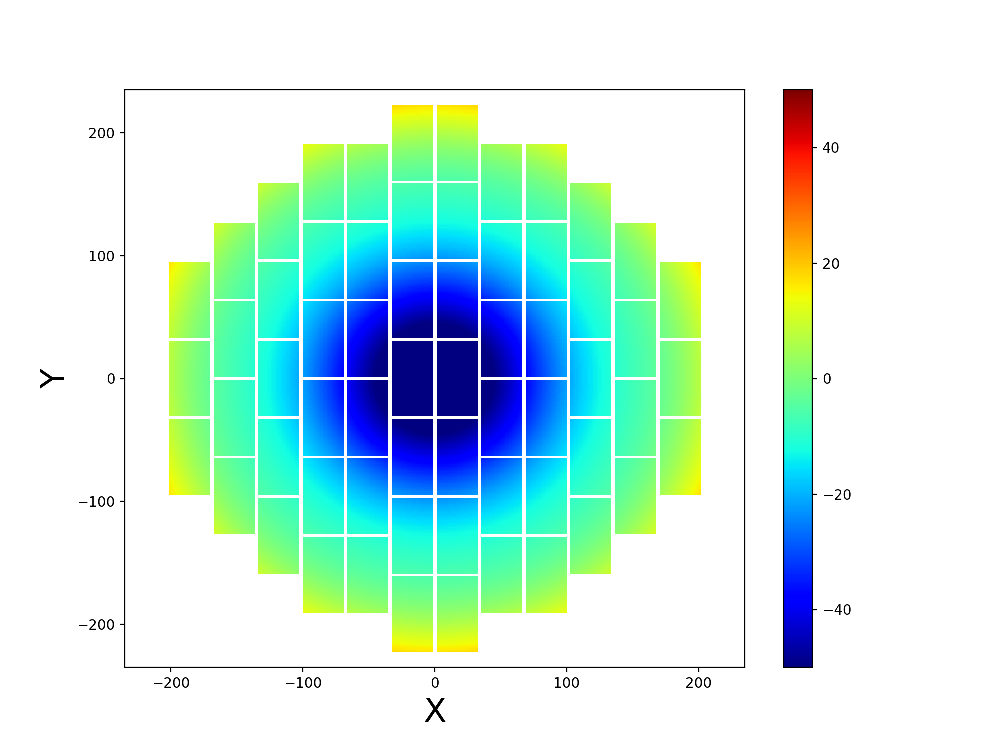

In [14]:
f,a,c = plotMPL2D(X_all,Y_all,Zemax_all)

<IPython.core.display.Javascript object>


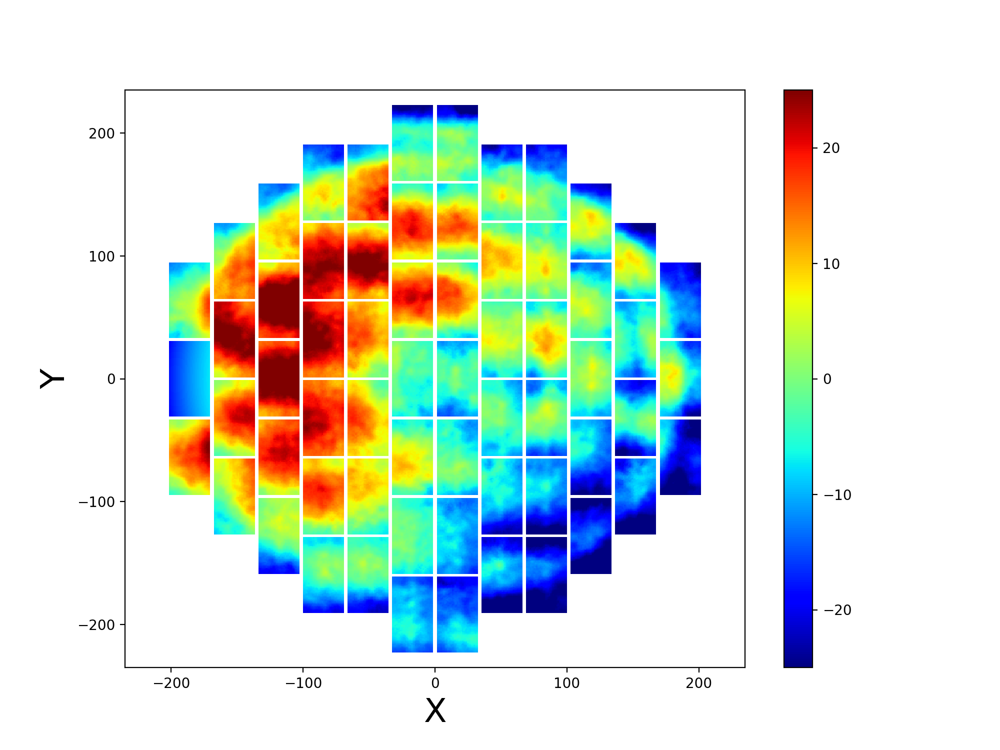

In [15]:
f,a,c = plotMPL2D(X_all,Y_all,zDiff,zmin=-25,zmax=25.)

In [16]:
# compare all bands - ideally these should look identical
# use the out of focus zemax file instead of the in-focus one -- that should make a bit of difference too
# what does the difference in Spherical do to the Focus value - not quite true that it all comes out in OptAtmo fitting of Spherical, if the 'shape' of the z4coeff is affected.
# that would imply redoing the Donuts with the extrafocal Zernikes instead...

# calculate the mean per sensor, and plot those for both -- to better compare the average shape
# it does appear that there is an overall bowing present - could be mechanical, or systematic in the Donuts, as above
# Really need to compare all Zernike terms!

In [17]:
dfDirectory = "ComboMeshesZemaxIteration2v22"
dfName = "ComboMesh_Science-20140212s2-v22i2_All"

zVarPattern="z%dcorr"
usedFlag=True
iZs = [4,5,6,7,8,9,10,11,14,15]
minDict={4:-20.,5:-0.2,6:-0.2,7:-0.125,8:-0.125,9:-0.3,10:-0.3,11:-0.15,14:-0.1,15:-0.1}
maxDict={4:20.,5:0.2,6:0.2,7:0.125,8:0.125,9:0.3,10:0.3,11:0.15,14:0.1,15:0.1}

da = mkDonutAnaDF(dfDirectory+"/"+dfName+".pkl",iZs,zVarPattern=zVarPattern,sensorSet="ScienceOnly",method="idw",methodVal=(250,1.0),nInterpGrid=32,donutCutString="flagFinal==True")



In [18]:
def autoRange(Z):
    """ determzine Z limits
    """

    minZ = 1.e50
    maxZ = -1.e50
    for iCoord in Z.keys():
        minZ = np.minimum(minZ,Z[iCoord].min())
        maxZ = np.maximum(maxZ,Z[iCoord].max())

    return minZ,maxZ

In [19]:
def plotZernikeDandZ(iZactual,da,zmin,zmax):
    # plot original coeff, Zemax and corrected difference
    minDict={4:-20.,5:-0.2,6:-0.2,7:-0.125,8:-0.125,9:-0.3,10:-0.3,11:-0.15,14:-0.1,15:-0.1}
    maxDict={4:20.,5:0.2,6:0.2,7:0.125,8:0.125,9:0.3,10:0.3,11:0.15,14:0.1,15:0.1}

    meshN = "z%dMesh" % (iZactual)
    if meshN in da.meshDict:
        aMesh = da.meshDict[meshN]
        X_all,Y_all,Xcen_all,Ycen_all,Z_all,ZVig_all = aMesh.calcMeshMPL2D()


    # get Zernike values at Xcen_all,Ycen_all, with the same format...
    Zemax_all = {}
    for akey in X_all:
        Zemax_all[akey] = zemaxWFmap.getArray(Xcen_all[akey].flatten(),Ycen_all[akey].flatten(),iZactual).reshape(Xcen_all[akey].shape)
 
        if iZactual==4:
            Zemax_all[akey] = Zemax_all[akey] * 1.189 * (1500./8.7)

    
    # subtract values in Z_all and Zemax_all
    # also find mean offset
    zDiff = {}
    n = 0
    sdiff = 0.
    for iCoord in Z_all.keys():
        # check that data is present in Donuts
        if np.sum(Z_all[iCoord].flatten())==0.:
            zDiff[iCoord] = Z_all[iCoord]
        else:
            zDiff[iCoord] = Z_all[iCoord] - Zemax_all[iCoord]
        n = n + 1
        sdiff = sdiff + np.mean(zDiff[iCoord].flatten())
    
    ave = sdiff/float(n)
    print("Mean difference = ",ave)

    for iCoord in Z_all.keys():
        zDiff[iCoord] = zDiff[iCoord] - ave        
        
    # plots
    anorm = colors.Normalize(zmin,zmax,True)
    cmap=cm.jet
    f,ax = plt.subplots(1,3,figsize=(20,5))
    axf = ax.flatten()
    
    # hard code X,Y limits to be DECam boundaries
    minX = -235.
    maxX = 235.
    minY = -235.
    maxY = 235.

    for iCoord in X_all.keys():
        cset = axf[0].pcolormesh(X_all[iCoord], Y_all[iCoord], ZVig_all[iCoord], cmap=cmap, norm=anorm)
    
    axf[0].set_xlabel('X',fontsize=24)
    axf[0].set_xlim(minX, maxX)
    axf[0].set_ylabel('Y',fontsize=24)
    axf[0].set_ylim(minY, maxY)

    # add the colorbar
    f.colorbar(cset,ax=axf[0])
    
    for iCoord in X_all.keys():
        cset = axf[1].pcolormesh(X_all[iCoord], Y_all[iCoord], Zemax_all[iCoord], cmap=cmap, norm=anorm)
    
    axf[1].set_xlabel('X',fontsize=24)
    axf[1].set_xlim(minX, maxX)
    axf[1].set_ylabel('Y',fontsize=24)
    axf[1].set_ylim(minY, maxY)

    # add the colorbar
    f.colorbar(cset,ax=axf[1])
    
    # Difference
    zmin,zmax = autoRange(zDiff)
    anorm = colors.Normalize(zmin,zmax,True)
    for iCoord in X_all.keys():
        cset = axf[2].pcolormesh(X_all[iCoord], Y_all[iCoord], zDiff[iCoord], cmap=cmap, norm=anorm)
    
    axf[2].set_xlabel('X',fontsize=24)
    axf[2].set_xlim(minX, maxX)
    axf[2].set_ylabel('Y',fontsize=24)
    axf[2].set_ylim(minY, maxY)

    # add the colorbar
    f.colorbar(cset,ax=axf[2])



Mean difference =  10.517530128823028


<IPython.core.display.Javascript object>


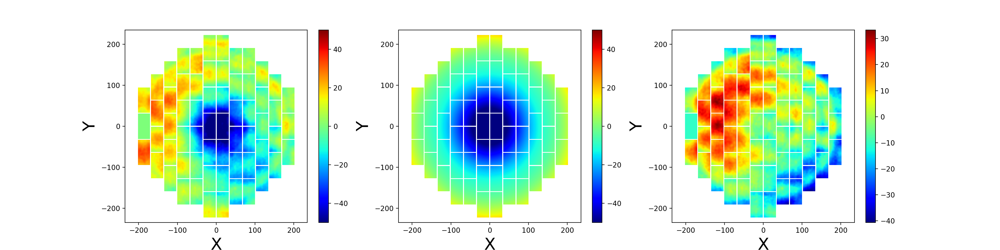

In [20]:
plotZernikeDandZ(4,da,-50.,50.)

Mean difference =  0.0031629010379266207


<IPython.core.display.Javascript object>


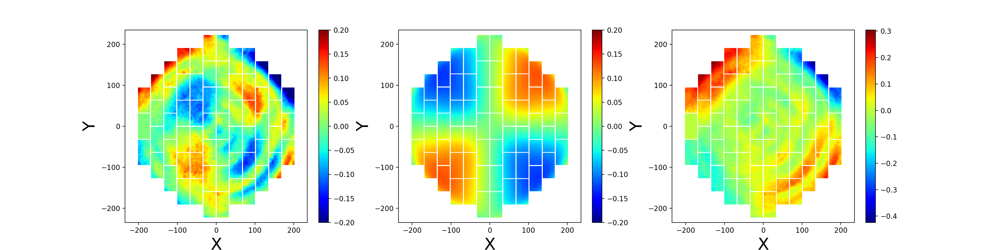

In [21]:
iZ=5
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  0.003226987377259684


<IPython.core.display.Javascript object>


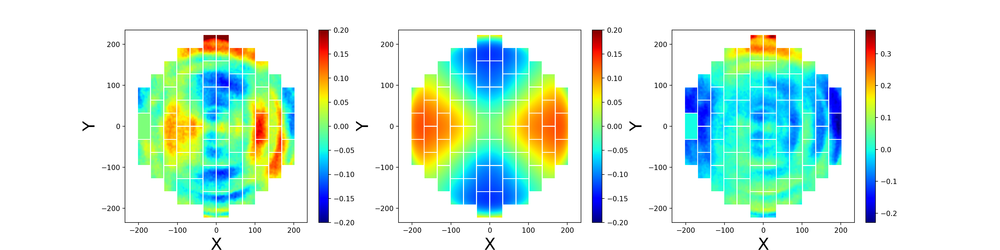

In [22]:
iZ=6
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  -0.001737948330753812


<IPython.core.display.Javascript object>


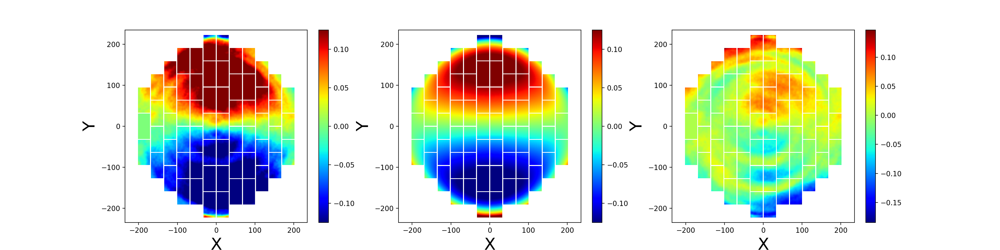

In [23]:
iZ=7
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  -0.0023910444860679573


<IPython.core.display.Javascript object>


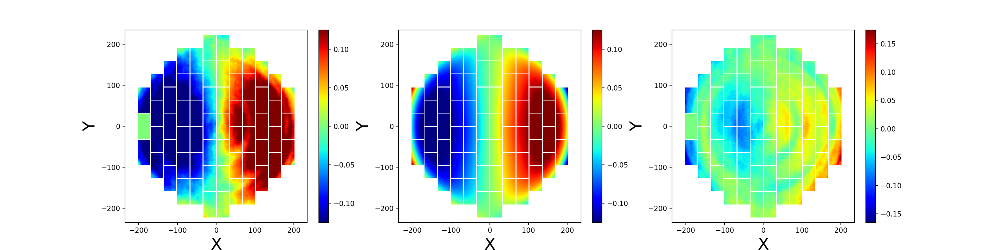

In [24]:
iZ=8
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  -0.0001031627120226584


<IPython.core.display.Javascript object>


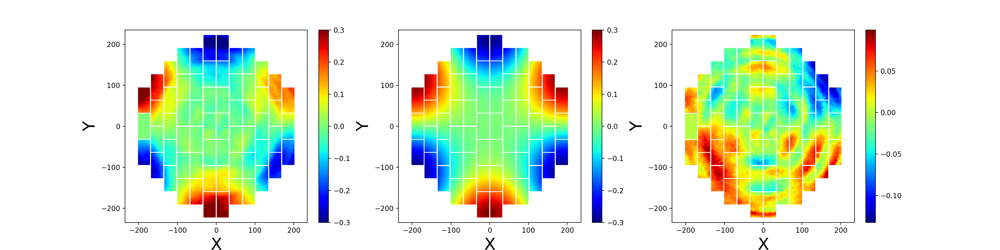

In [25]:
iZ=9
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  0.0019154987372636133


<IPython.core.display.Javascript object>


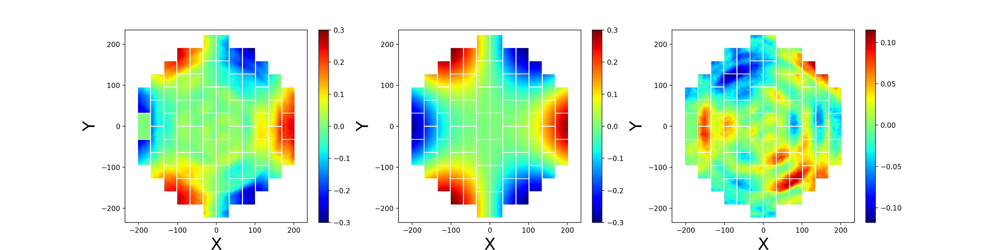

In [26]:
iZ=10
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  0.0007416878337138687


<IPython.core.display.Javascript object>


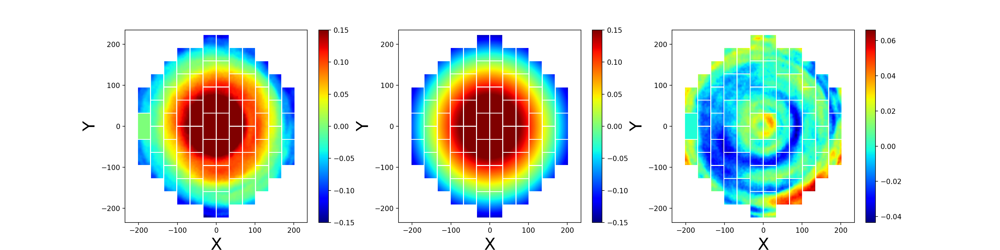

In [27]:
iZ=11
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  -0.0002857790223396496


<IPython.core.display.Javascript object>


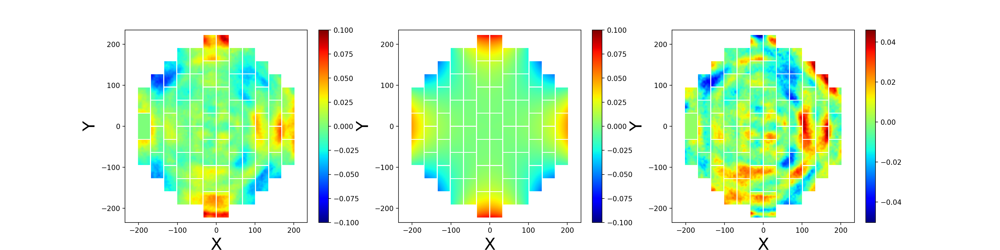

In [28]:
iZ=14
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

Mean difference =  0.0007223457389443585


<IPython.core.display.Javascript object>


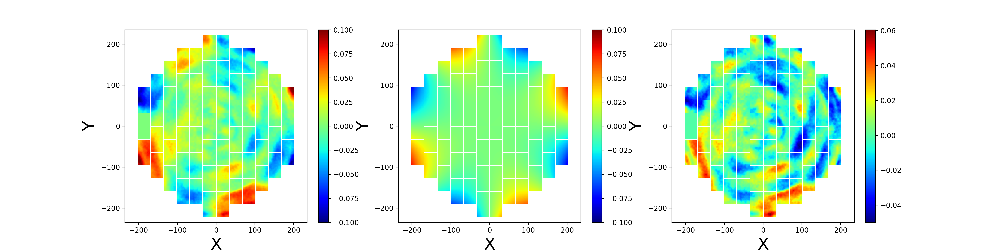

In [29]:
iZ=15
plotZernikeDandZ(iZ,da,minDict[iZ],maxDict[iZ])

In [30]:
# read in Shape Mode i-band residuals
from astropy.io import fits
hdu  = fits.open('/u/ec/roodman/Astrophysics/Piff/shape_mode_meanify.fits')


In [31]:
meanify = hdu[1].data
print(meanify.columns)
upiff = meanify['COORDS0'][0][:,0]
vpiff = meanify['COORDS0'][0][:,1]
atmo_size = meanify['PARAMS0'][0][:,0]
atmo_g1 = meanify['PARAMS0'][0][:,1]
atmo_g2 = meanify['PARAMS0'][0][:,2]
print(upiff.shape,vpiff.shape,atmo_size.shape)

ColDefs(
    name = 'COORDS0'; format = '85030D'; dim = '(2,42515)'
    name = 'PARAMS0'; format = '1743115D'; dim = '(41,42515)'
)
(42515,) (42515,) (42515,)


<IPython.core.display.Javascript object>


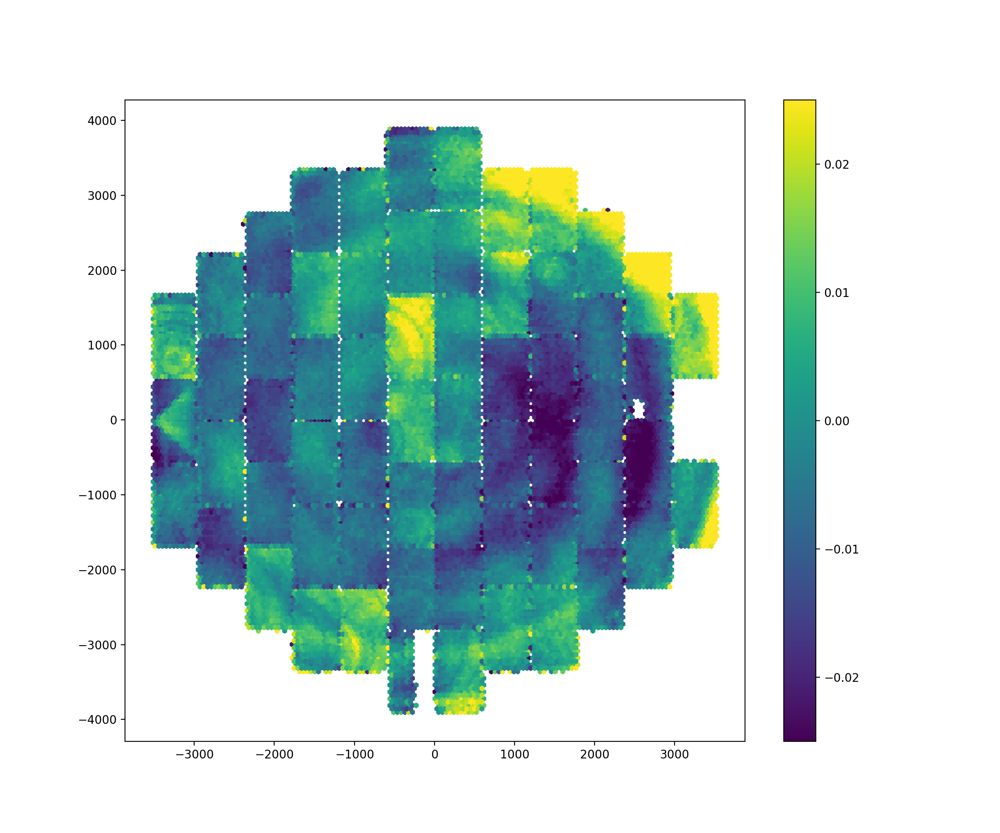

In [32]:
f,ax = plt.subplots(1,1,figsize=(12,10))
h = ax.hexbin(-vpiff,upiff,atmo_size,gridsize=150,vmin=-0.025,vmax=0.025)
f.colorbar(h,ax=ax)

<IPython.core.display.Javascript object>


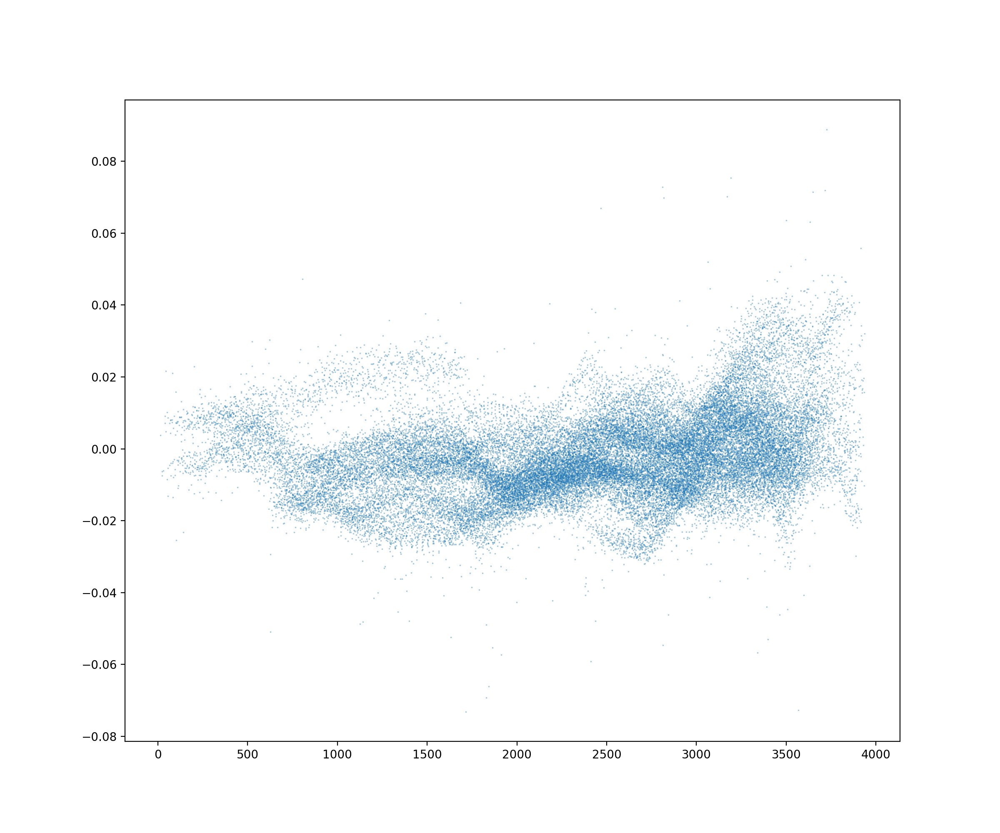

In [33]:
f,ax = plt.subplots(1,1,figsize=(12,10))
s = ax.scatter(np.sqrt(vpiff*vpiff+upiff*upiff),atmo_size,marker='.',s=0.1)


<IPython.core.display.Javascript object>


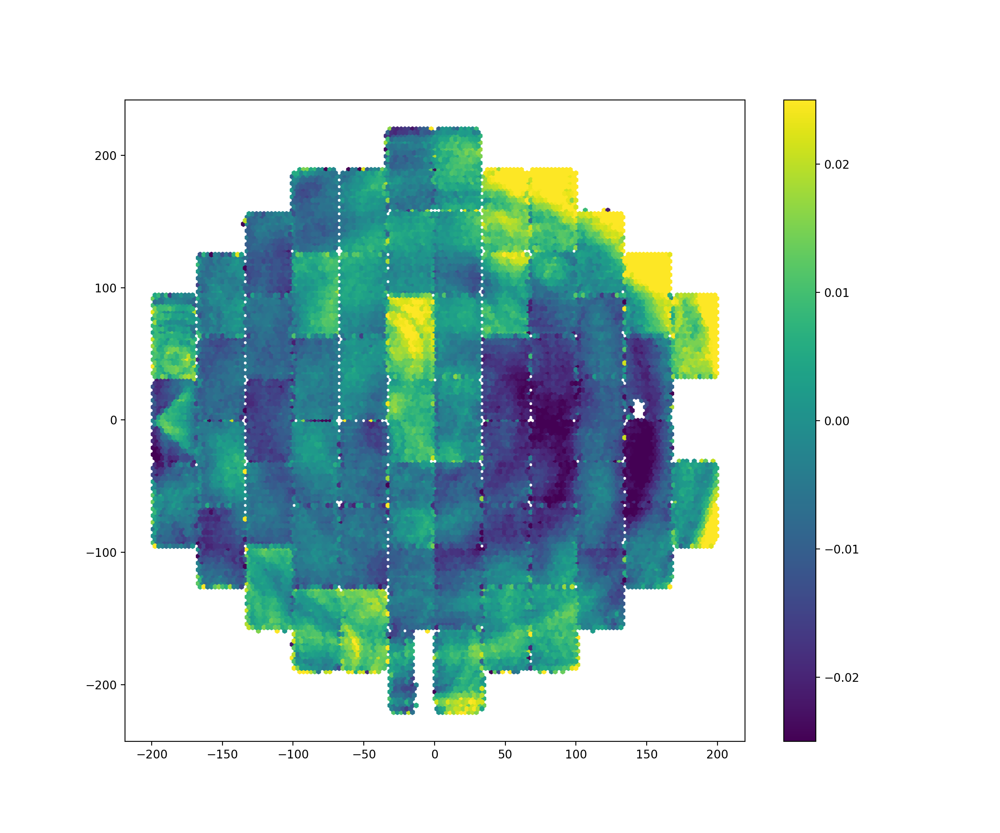

In [34]:
mmperarcsec = 0.015/0.265
f,ax = plt.subplots(1,1,figsize=(12,10))
h = ax.hexbin(-vpiff*mmperarcsec,upiff*mmperarcsec,atmo_size,gridsize=150,vmin=-0.025,vmax=0.025)
f.colorbar(h,ax=ax)

In [37]:
print(da.meshDict['z4Mesh'].coordList)

['S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10', 'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20', 'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27', 'S28', 'S29', 'S30', 'S31', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'N8', 'N9', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29', 'N30', 'N31']


In [40]:
expnum=228724

# get average atmo_size by sensor, and compare against diffusion values
# Read solution set from default files.
    
maps = DESMaps()

decamInfo = decaminfo()

iZactual = 4
meshN = "z%dMesh" % (iZactual)
if meshN in da.meshDict:
    aMesh = da.meshDict[meshN]
    X_all,Y_all,Xcen_all,Ycen_all,Z_all,ZVig_all = aMesh.calcMeshMPL2D()

# Acquire the WCS for desired exposure, CCD combination
# ValueError will be raised if there is no astrometric solution for this combination.
PixelSize_all = {}
    
for ccdnum in X_all:
    print(ccdnum)
    # get wcs for this Sensor
    wcs = maps.getDESWCS(expnum, ccdnum)
        
    # loop over points, get pixel coord. and then ra,dec
    Xf_all = Xcen_all[ccdnum].flatten()
    Yf_all = Ycen_all[ccdnum].flatten()
        
    sizef_all = np.zeros(Xf_all.shape)
        
    ix_all,iy_all = decamInfo.getPixel(ccdnum,Xf_all,Yf_all)  
        
    # Map pixel coordinates to RA, Dec, specifying object color
    c = 1.4
    ra,dec = wcs.toSky(ix_all,iy_all,c)

    # Now we're going to ask the WCS to reproject coordinates
    # into a gnomonic projection about a new point, in units of degrees

    for i in range(ra.shape[0]):
        wcs.reprojectTo( Gnomonic(ra[i],dec[i]) )
        size = np.sqrt(np.abs(np.linalg.det(wcs.jacobian(ix_all[i],iy_all[i],c)))*(3600.*3600.))
        sizef_all[i] = size
        
    PixelSize_all[ccdnum] = sizef_all.reshape(Xcen_all[ccdnum].shape)



        
        
    
   
        

 

S1
S2
S3
S4
S5
S6
S7
S8
S9
S10
S11
S12
S13
S14
S15
S16
S17
S18
S19
S20
S21
S22
S23
S24
S25
S26
S27
S28
S29
S30
S31
N1
N2
N3
N4
N5
N6
N7
N8
N9
N10
N11
N12
N13
N14
N15
N16
N17
N18
N19
N20
N21
N22
N23
N24
N25
N26
N27
N28
N29
N30


IndexError: ('No 2d tweaks available for detpos', 'N30')

<IPython.core.display.Javascript object>


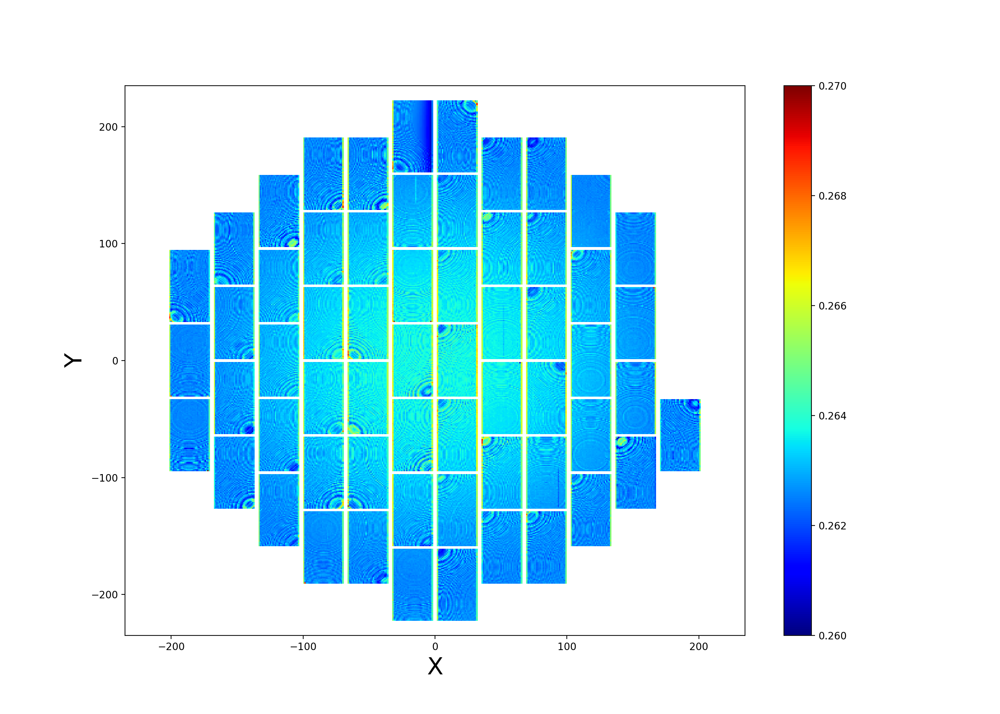

In [46]:
# plots
zmin = 0.26
zmax = 0.27
anorm = colors.Normalize(zmin,zmax,True)
cmap=cm.jet
f,ax = plt.subplots(1,1,figsize=(14,10))
    
# hard code X,Y limits to be DECam boundaries
minX = -235.
maxX = 235.
minY = -235.
maxY = 235.

for iCoord in X_all.keys():
    if iCoord != 'N30' and iCoord!='N31':
        cset = ax.pcolormesh(X_all[iCoord], Y_all[iCoord], PixelSize_all[iCoord], cmap=cmap, norm=anorm)
    
ax.set_xlabel('X',fontsize=24)
ax.set_xlim(minX, maxX)
ax.set_ylabel('Y',fontsize=24)
ax.set_ylim(minY, maxY)

# add the colorbar
f.colorbar(cset,ax=ax)

In [59]:
expnum=228724

# get average atmo_size by sensor, and compare against diffusion values
# Read solution set from default files.
    
maps = DESMaps()

decamInfo = decaminfo()

iZactual = 4
meshN = "z%dMesh" % (iZactual)
if meshN in da.meshDict:
    aMesh = da.meshDict[meshN]
    X_all,Y_all,Xcen_all,Ycen_all,Z_all,ZVig_all = aMesh.calcMeshMPL2D()

# Acquire the WCS for desired exposure, CCD combination
# ValueError will be raised if there is no astrometric solution for this combination.
PixelSize2_all = {}
    
for ccdnum in X_all:
    print(ccdnum,)
    # get wcs for this Sensor
    try:
        wcs = maps.getDESWCS(expnum, ccdnum)
        
        # loop over points, get pixel coord. and then ra,dec
        Xf_all = Xcen_all[ccdnum].flatten()
        Yf_all = Ycen_all[ccdnum].flatten()
                
        ix_all,iy_all = decamInfo.getPixel(ccdnum,Xf_all,Yf_all)  
        
        # Map pixel coordinates to Jacobian specifying object color
        c = 1.4
        sizes_all = np.sqrt(np.abs(np.linalg.det(wcs.jacobian(ix_all,iy_all,c)))*(3600.*3600.))
        
        PixelSize2_all[ccdnum] = sizes_all.reshape(Xcen_all[ccdnum].shape)
        
    except:
        PixelSize2_all[ccdnum] = None



        
        
    

S1
S2
S3
S4
S5
S6
S7
S8
S9
S10
S11
S12
S13
S14
S15
S16
S17
S18
S19
S20
S21
S22
S23
S24
S25
S26
S27
S28
S29
S30
S31
N1
N2
N3
N4
N5
N6
N7
N8
N9
N10
N11
N12
N13
N14
N15
N16
N17
N18
N19
N20
N21
N22
N23
N24
N25
N26
N27
N28
N29
N30
N31


<IPython.core.display.Javascript object>


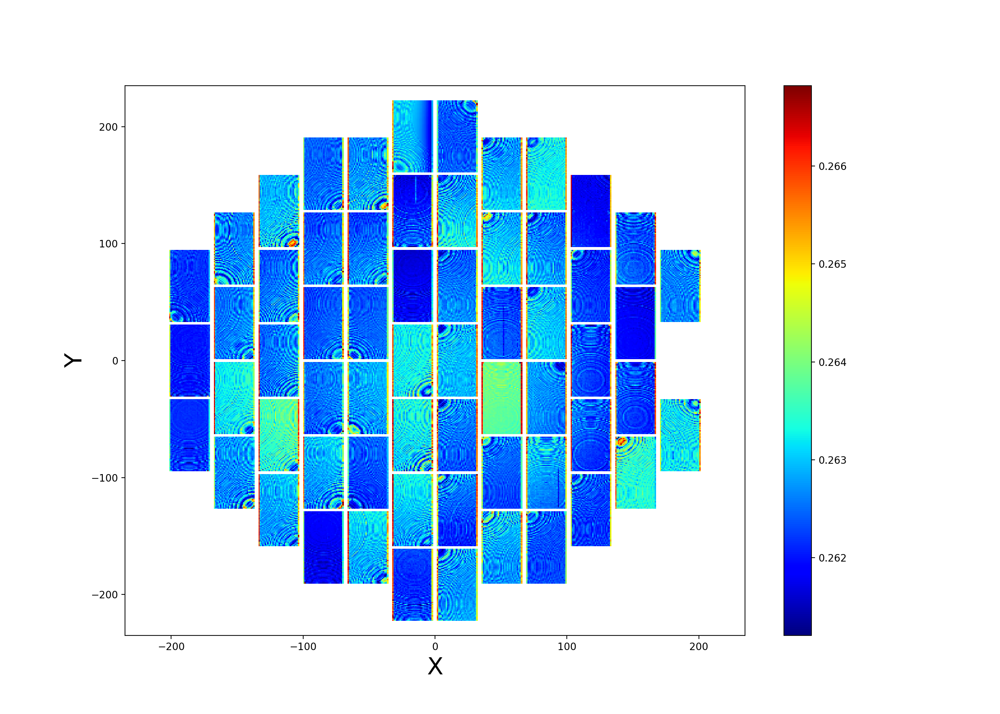

In [60]:
# plots
zmin = 0.26
zmax = 0.27
anorm = colors.Normalize(zmin,zmax,True)
cmap=cm.jet
f,ax = plt.subplots(1,1,figsize=(14,10))
    
# hard code X,Y limits to be DECam boundaries
minX = -235.
maxX = 235.
minY = -235.
maxY = 235.

for iCoord in X_all.keys():
    if PixelSize2_all[iCoord] is not None: 
        cset = ax.pcolormesh(X_all[iCoord], Y_all[iCoord], PixelSize2_all[iCoord], cmap=cmap)
    
ax.set_xlabel('X',fontsize=24)
ax.set_xlim(minX, maxX)
ax.set_ylabel('Y',fontsize=24)
ax.set_ylim(minY, maxY)

# add the colorbar
f.colorbar(cset,ax=ax)